In [3]:
graph_root = '/mnt/s3/lhm/HCC_level_1'
seg_root = '/mnt/s3/lhm/HCC_seg_1'
slide_root = '/mnt/s3/lhm/HCC'

In [4]:
import os
import glob
import cv2
from utils.utils_single import read_points_from_xml
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import slic, mark_boundaries

In [5]:
slides = glob.glob('/mnt/s3/lhm/HCC/*/*.mrxs')
thumbs = glob.glob('/mnt/s3/lhm/HCC_thumb/*/*.png')
len(slides), len(thumbs)

(128, 128)

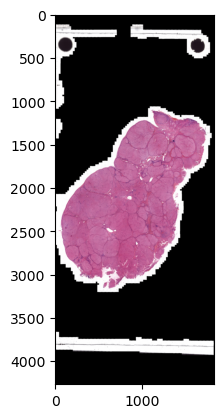

(2027, 1648) [1127, 80] (4267, 1830, 3)


In [6]:
t = thumbs[1]
t = "/mnt/s3/lhm/HCC_thumb/0/6M15.png"
img_s = cv2.imread(t)
plt.imshow(img_s)
plt.show()
name = t.split('/')[-1].split('.')[0]
label = t.split('/')[-2]
graph = np.load(f'{graph_root}/{name}.npy', allow_pickle=True).item()
if 'M' in name and name[-1] == '-':
    name = name[:-1]
polygons = []
if os.path.exists('/mnt/s3/lhm/HCC' + '/xml/' + f'{name}_Annotations.xml'):
    polygons = read_points_from_xml(liver_name=f'{name}_Annotations.xml', scale=64,
                                    xml_path='/mnt/s3/lhm/HCC' + '/xml/',
                                    dataset='HCC_LOWER')
seg_map = np.load(f'{seg_root}/{name}.npy')
offset = graph['offset']
print(seg_map.shape, offset, img_s.shape)

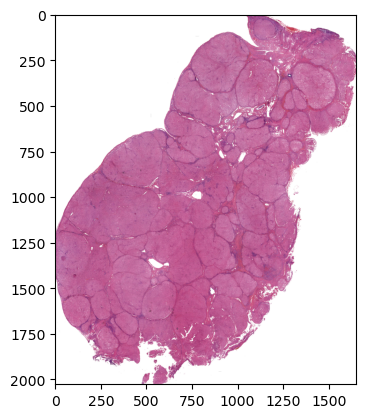

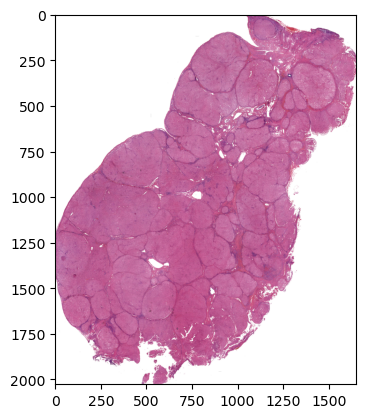

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


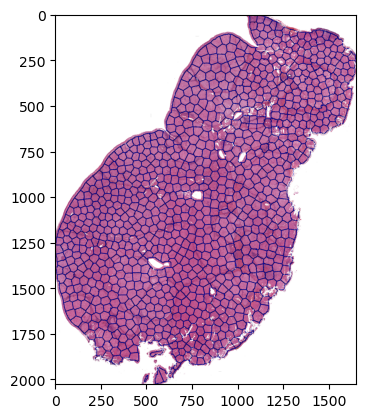

In [7]:
img = img_s[offset[0]:offset[0] + seg_map.shape[0], offset[1]:offset[1] + seg_map.shape[1], :].copy()
hsv_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
lower_white = np.array([0, 0, 220])  # 假设threshold是一个你选择的值
upper_white = np.array([180, 255, 255])
lower_black = np.array([0, 0, 0])
upper_black = np.array([180, 255, 50])
# 创建掩模来分离白色和黑色背景
mask1 = cv2.inRange(hsv_image, lower_white, upper_white)
mask2 = cv2.inRange(hsv_image, lower_black, upper_black)
# 使用 cv2.bitwise_or 来合并掩模
mask = 255 - cv2.bitwise_or(mask1, mask2)
# kernel = np.ones((10, 10), np.uint8)
# mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
# mask = cv2.erode(mask, kernel, iterations=2)
img[mask == 0] = (255, 255, 255)
# plt.figure(dpi=300)
plt.imshow(img)
# plt.axis('off')
plt.show()
# plt.figure(dpi=300)
for pp in polygons:
    pp = np.array(pp) - [offset[1], offset[0]]
    plt.plot([p[0] for p in pp], [p[1] for p in pp], 'r-')
plt.imshow(img)
# plt.axis('off')
plt.show()
# segments = slic(img, n_segments=1024, compactness=5, sigma=5, slic_zero=True, start_label=0, )
segments = np.load(f'{seg_root}/{name}.npy')
boundary = mark_boundaries(img, segments, color=(0, 0, 1), outline_color=(0, 0, 0))
boundary[mask == 0] = (255, 255, 255)
# plt.figure(dpi=300)
plt.imshow(boundary)
# plt.axis('off')
plt.show()

# 为每个超像素块生成一个 node ，可视化结果

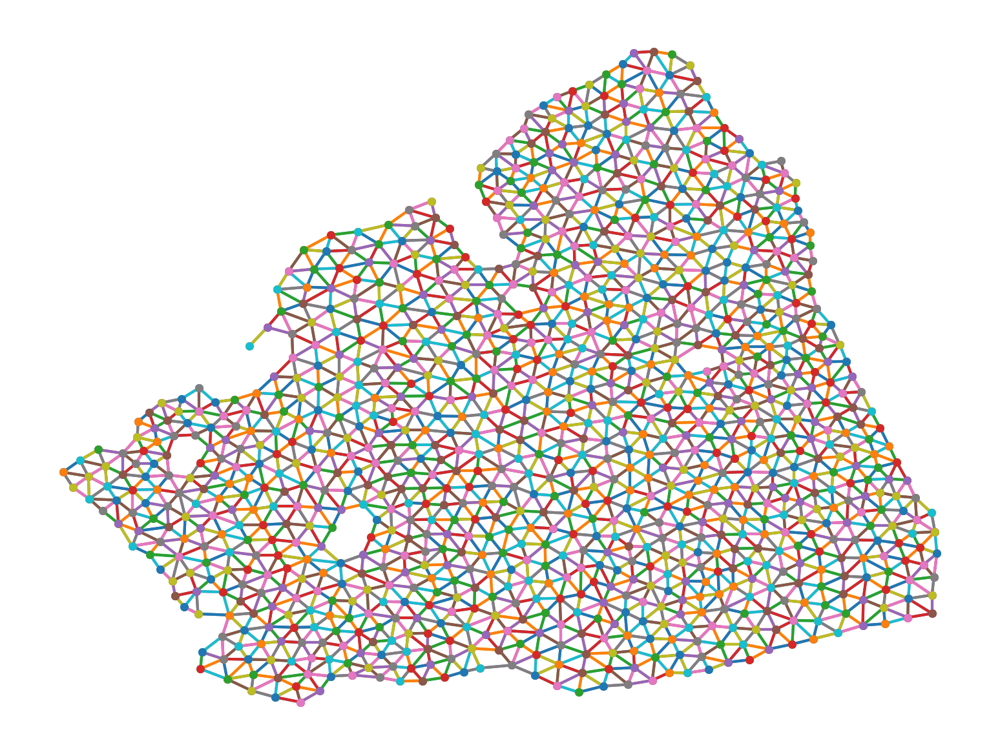

In [274]:
coord = graph['pos'] // 64 - offset
edge = graph['edge']
plt.figure(dpi=300)
for i in range(len(edge)):
    plt.plot([coord[edge[i][1]][1], coord[edge[i][0]][1]], [coord[edge[i][1]][0], coord[edge[i][0]][0]], marker='o',
             markersize=2, linewidth=1)
plt.axis('off')
plt.show()

# 读一下2级区域

In [8]:
import openslide

In [9]:
slide = openslide.open_slide(f'{slide_root}/{label}/{name}.mrxs')
slide.level_downsamples, slide.level_dimensions  #8倍

((1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0),
 ((117140, 273140),
  (58570, 136570),
  (29285, 68285),
  (14642, 34142),
  (7321, 17071),
  (3660, 8535),
  (1830, 4267),
  (915, 2133),
  (457, 1066),
  (228, 533),
  (114, 266)))

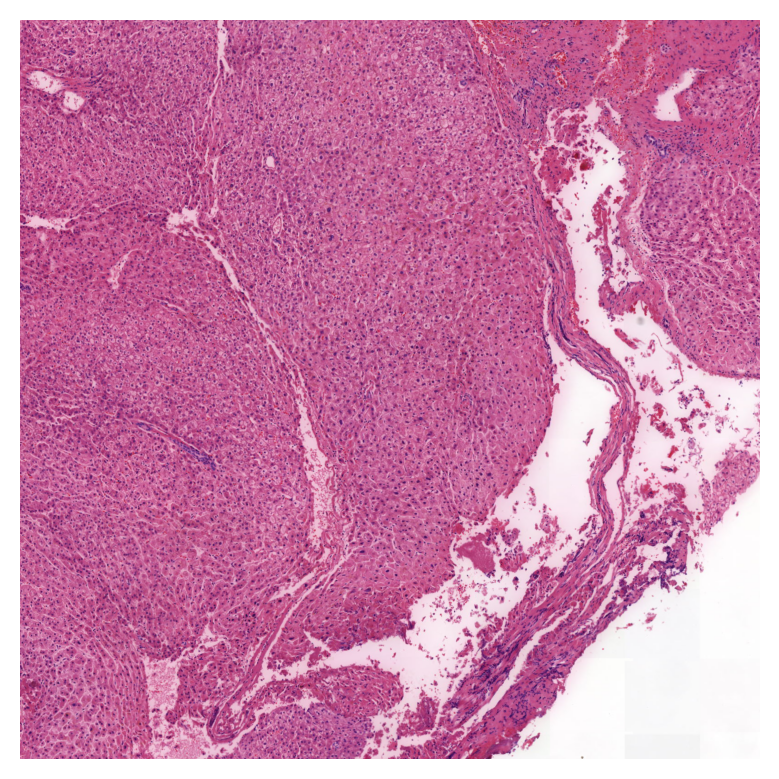

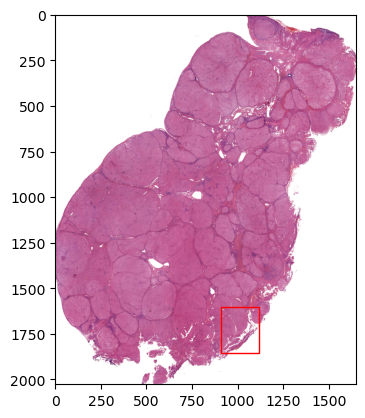

In [14]:
# focus = np.array([400, 1250])
import matplotlib.patches as patches
focus = np.array([1600, 910])
loc = focus + offset
loc = np.array(loc) * 64
loc = loc[[1, 0]]
# foc = slide.read_region(loc, 3, [segments.shape[1], segments.shape[0]]).convert('RGB')
foc = slide.read_region(loc, 3, [200*8, 200*8]).convert('RGB')
plt.figure(dpi=200)
# 显示结果

plt.axis('off')
foc = np.array(foc)
plt.imshow(foc)
plt.show()

plt.imshow(img)
rect = patches.Rectangle((focus[1],focus[0]), segments.shape[1]//8, segments.shape[0]//8, linewidth=1, edgecolor='r', facecolor='none')
# 将矩形框添加到当前的轴（Axes）上
plt.gca().add_patch(rect)
plt.show()

(1628, 1805, 3)


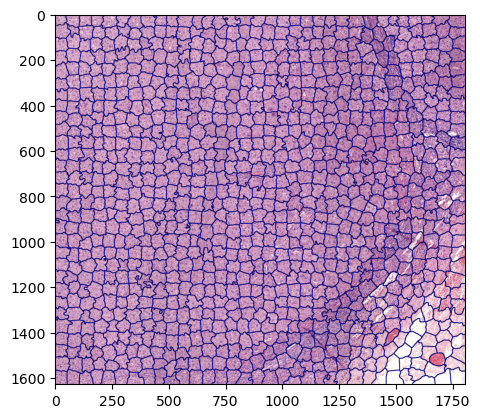

In [282]:
print(foc.shape)
fsegment = slic(foc, n_segments=1024, compactness=5, sigma=5, slic_zero=True, start_label=0, )
fboundary = mark_boundaries(foc, fsegment, color=(0, 0, 1), outline_color=(0, 0, 0))
plt.imshow(fboundary)
plt.show()

In [283]:
vs_right = np.vstack([fsegment[:, :-1].ravel(), fsegment[:, 1:].ravel()])
vs_below = np.vstack([fsegment[:-1, :].ravel(), fsegment[1:, :].ravel()])
segments_ids = np.unique(fsegment)
fpos = np.array([np.mean(np.nonzero(fsegment == i), axis=1) for i in segments_ids])
bneighbors = np.unique(np.hstack([vs_right, vs_below]), axis=1)

In [284]:
loc_map = segments[focus[0]:focus[0] + segments.shape[0] // 8,
          focus[1]:focus[1] + segments.shape[1] // 8].copy().astype(np.uint8)
dst = cv2.resize(loc_map, (segments.shape[1], segments.shape[0]), interpolation=cv2.INTER_LINEAR)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


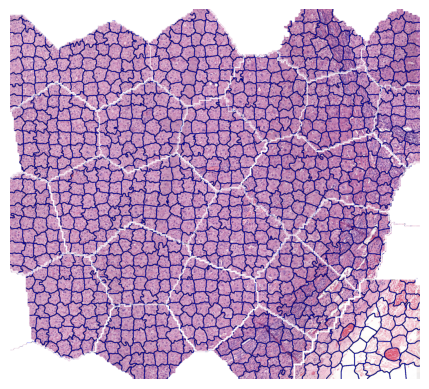

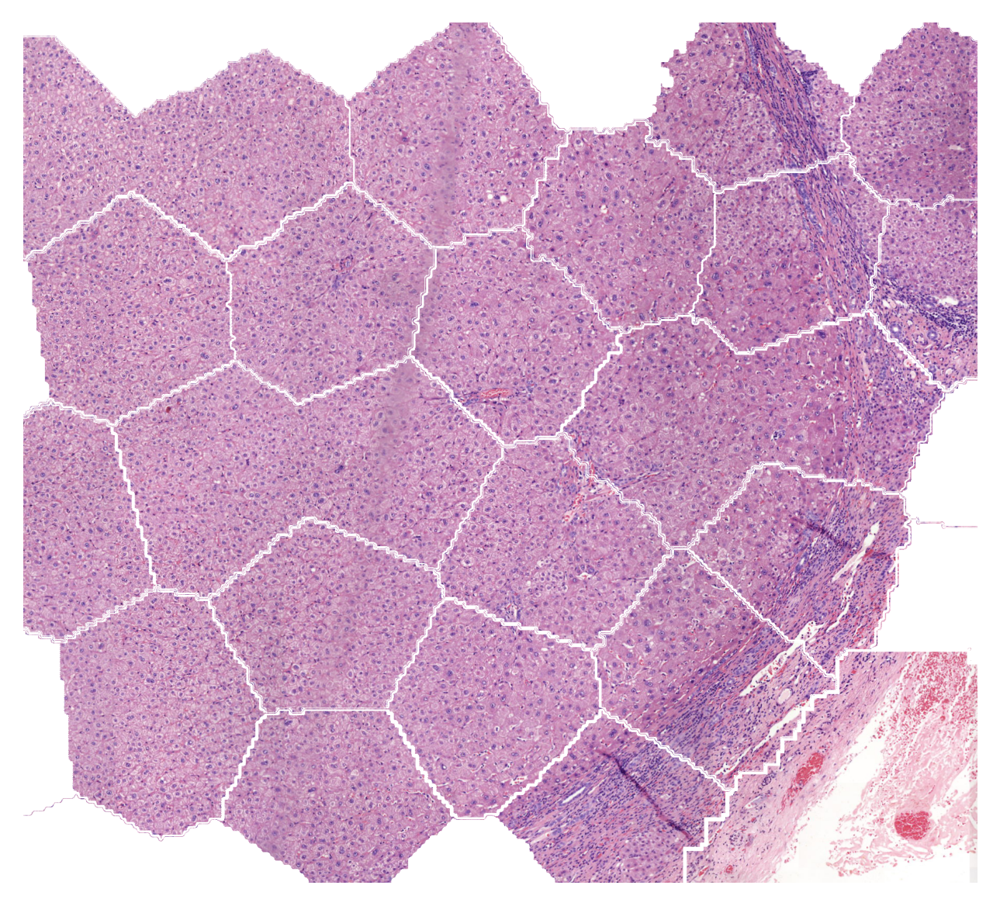

In [287]:
colors, indices = np.unique(dst, return_inverse=True)
color_counts = np.bincount(indices)
top_k_colors = colors[np.argsort(-color_counts)[:25]]
mask = np.isin(dst, top_k_colors)
mask = ~mask
fboundary[mask] = (255, 255, 255)
foc[mask] = (255, 255, 255)
plt.imshow(fboundary)
plt.axis('off')
plt.show()
plt.figure(dpi=300)
plt.imshow(foc)
plt.axis('off')
plt.show()

(1628, 1805) (990, 2)


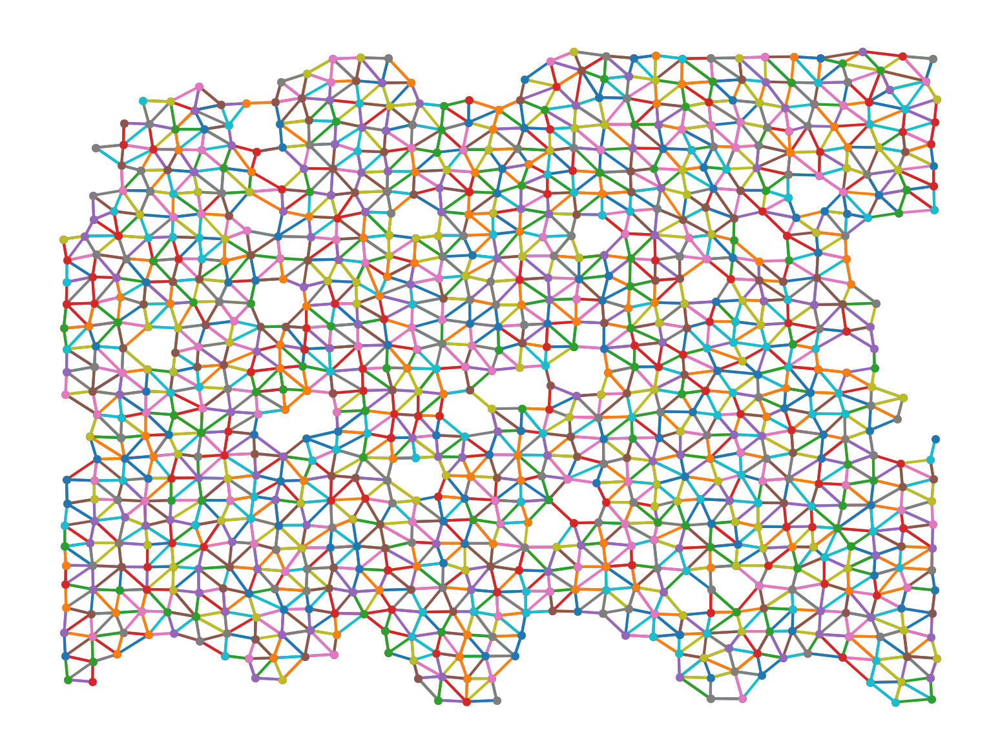

In [289]:
coord = fpos
edge = bneighbors.T
print(mask.shape, coord.shape)
plt.figure(dpi=300)
for i in range(len(edge)):
    if mask[int(coord[edge[i][0]][0]), int(coord[edge[i][0]][1])] or mask[int(coord[edge[i][1]][0]), int(coord[edge[i][1]][1])]:
        continue
    plt.plot([coord[edge[i][0]][1], coord[edge[i][1]][1]], [coord[edge[i][0]][0], coord[edge[i][1]][0]], marker='o',
             markersize=2, linewidth=1)
plt.axis('off')
plt.show()